In [1]:
pwd

'C:\\Users\\User\\Desktop\\wildlife'

CODEQUEST 


Domain:Data Science


Topic: wlidlife classification

#importing modules to read , resize the images

In [1]:
import os 
import keras
import numpy as np 
import pandas as pd
from glob import glob
import tensorflow as tf
from IPython.display import clear_output as cls

# Data 
from tensorflow.keras.utils import load_img, img_to_array
from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

In [2]:
import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix

In [3]:
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

# Callbacks 
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-Trained Model
from tensorflow.keras.applications import ResNet50V2

reading the images from the animal directory

In [4]:
IMAGE_SIZE = 256
EPOCHS=10
df= tf.keras.preprocessing.image_dataset_from_directory(
    "animals",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE)
)

Found 3554 files belonging to 3 classes.


In [5]:
class_names = df.class_names

Dividing the data into 3 section 

one for training the model

one for testing the model

one for validating the results

In [6]:
class_names = df.class_names
n_classes = len(class_names)
# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 3 
Class Names : ['test', 'train', 'validation']


Reading the train data

In [7]:
import os

root_path = 'C:\\Users\\User\\Desktop\\wildlife\\animals\\train'
class_names = [name for name in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, name)) and name != 'animals.ipynb_checkpoints']
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(os.path.join(root_path, name))) for name in class_names]

# Show
print(f"Total Number of Classes: {n_classes}\nClass Names: {class_names}")
print("Class Distribution:")
for name, count in zip(class_names, class_dis):
    print(f"{name}: {count} images")

Total Number of Classes: 5
Class Names: ['Elephant', 'fox animal', 'lion', 'tiger', 'zebra']
Class Distribution:
Elephant: 106 images
fox animal: 159 images
lion: 80 images
tiger: 90 images
zebra: 222 images


In [8]:
fig = px.pie(names=class_names, values=class_dis, title="Training Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.48}})
fig.show()

In [9]:
fig = px.bar(x=class_names, y=class_dis, title="Training Class Distribution", color=class_names)
fig.update_layout({'title':{'x':0.48}})
fig.show()

Reading the vlidation data

In [11]:
import os

test_path = 'C:\\Users\\User\\Desktop\\wildlife\\animals\\validation\\'
class_names = [name for name in os.listdir(valid_path) if os.path.isdir(os.path.join(valid_path, name))]

# Class Distribution
class_dis = [len(os.listdir(os.path.join(valid_path, name))) for name in class_names]

# Rest of your code...


# Pie
fig = px.pie(names=class_names, values=class_dis, title="Testing Class Distribution", color=class_names, hole=0.2)
fig.update_layout({'title':{'x':0.48}})
fig.show()

# Visualize 
fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

finding different categories present in the data

In [34]:
# Initialize Generator
train_gen = ImageDataGenerator(rescale=1/255., rotation_range=10, horizontal_flip=True)
valid_gen = ImageDataGenerator(rescale=1/255.)
test_gen = ImageDataGenerator(rescale=1/255)

# Load Data
train_ds = train_gen.flow_from_directory(root_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32) 
valid_ds = valid_gen.flow_from_directory(valid_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32) 
test_ds = test_gen.flow_from_directory(test_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 657 images belonging to 5 classes.
Found 1446 images belonging to 5 classes.
Found 1446 images belonging to 5 classes.


resizing the each into into same number of pixels

In [35]:
from tensorflow.keras import models, layers
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

In [36]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_ds):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(len(images))
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
            cls()
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

loading the each image link and checking the category of the sample images

In [37]:
def load_image(path):
    '''This function will load the image present at the given location'''
    image = tf.cast(tf.image.resize(img_to_array(load_img(path))/255., (256,256)), tf.float32)
    return image
def show_image(image, title=None):
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)

displaying the images

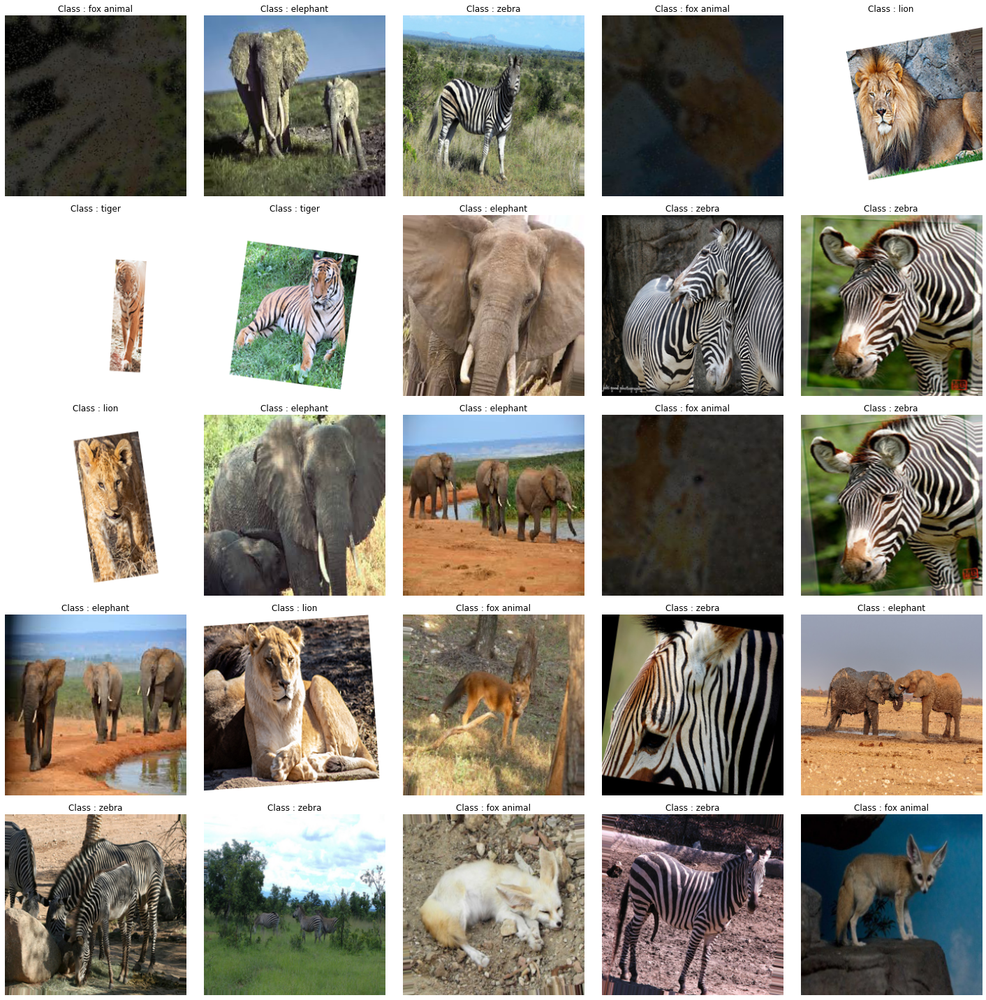

In [38]:
show_images(data=train_ds)

developing the Deep learning model for animal classification this module is present in the tensorflow we use the ResNet50V2 with is a CNN Alorithm

checking the accuracy of random group of images

In [39]:
# Pre-Trained Model 
base_model = ResNet50V2(input_shape=(256,256,3), include_top=False)
base_model.trainable = False
cls()

    # Model Architecture
name = "ResNet50V2"
model = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu', kernel_initializer='he_normal'),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
    ], name=name)
#  Callbacks
cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(name + ".h5", save_best_only=True)]

    # Model 
opt = tf.keras.optimizers.Adam(learning_rate=2e-3)
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

    # Model Training
history = model.fit(train_ds, validation_data=valid_ds, callbacks=cbs, epochs=5)

Epoch 1/5
21/21 [==============================] - 207s 10s/step - loss: 0.2378 - accuracy: 0.9269 - val_loss: 0.0881 - val_accuracy: 0.9633
Epoch 2/5
21/21 [==============================] - 186s 9s/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 0.0681 - val_accuracy: 0.9876
Epoch 3/5
21/21 [==============================] - 199s 10s/step - loss: 5.7846e-04 - accuracy: 1.0000 - val_loss: 0.0287 - val_accuracy: 0.9938
Epoch 4/5
21/21 [==============================] - 189s 9s/step - loss: 1.6354e-04 - accuracy: 1.0000 - val_loss: 0.0253 - val_accuracy: 0.9959
Epoch 5/5
21/21 [==============================] - 200s 10s/step - loss: 7.4269e-05 - accuracy: 1.0000 - val_loss: 0.0243 - val_accuracy: 0.9959


the number of images lost in training and validation 

the variation in the accuracies are displayed using matplot library

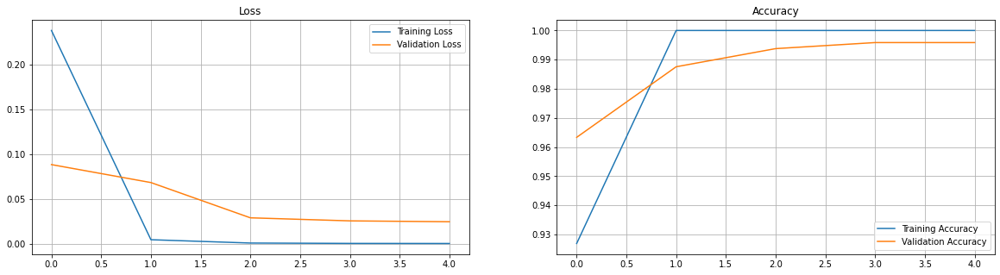

In [40]:
data = pd.DataFrame(history.history)
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
plt.plot(data.loss, label='Training Loss')
plt.plot(data.val_loss, label='Validation Loss')
plt.title("Loss")
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(data.accuracy, label='Training Accuracy')
plt.plot(data.val_accuracy, label='Validation Accuracy')
plt.title("Accuracy")
plt.grid()
plt.legend()

plt.show()

model.evaluate(test_ds)

the accuracy of the is 0.9959

we can see the output in the images from validation org stands for original and pred stands for predicted


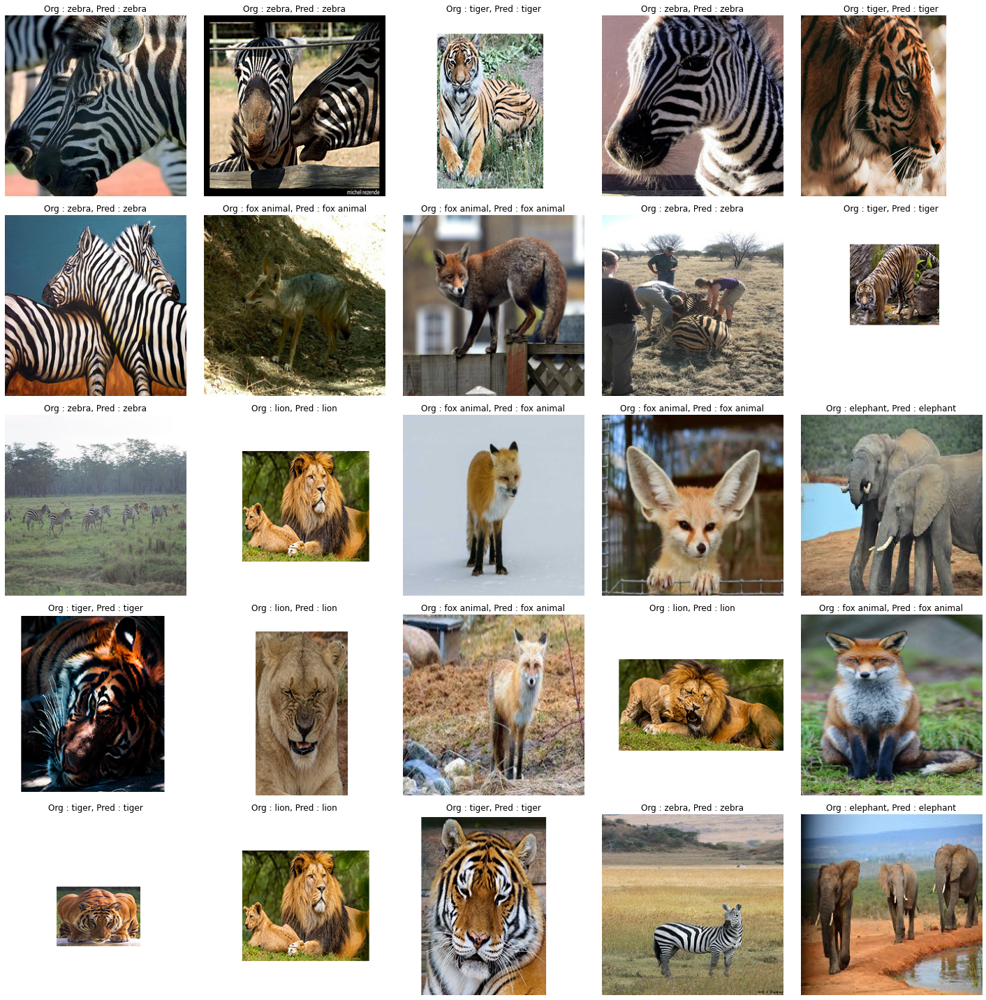

In [42]:
show_images(model=model, data=test_ds)